<a href="https://colab.research.google.com/github/sigvum/ufabc/blob/main/AERE_Atividade_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Análise Espacial de Redes: [Atividade avaliativa 1]

Nome: André Luiz Schilling

In [2]:
!pip install osmnx
!pip install mapclassify
import osmnx as ox
import networkx as nx
import matplotlib.pyplot as plt
import geopandas as gpd
import folium
import mapclassify
import warnings
from matplotlib.lines import Line2D

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.5/107.5 kB 8.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 39.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 70.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.3/17.3 MB 86.3 MB/s eta 0:00:00
  Attempting uninstall: networkx
    Found existing installation: networkx 3.4.2
    Uninstalling networkx-3.4.2:
      Successfully uninstalled networkx-3.4.2
  Attempting uninstall: geopandas
    Found existing installation: geopandas 1.0.1
    Uninstalling geopandas-1.0.1:
      Successfully uninstalled geopandas-1.0.1
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.1/59.1 kB 4.3 MB/s eta 0:00:00


# 1. Definição do Bairro:
- Trancoso, Porto Seguro, Bahia, Brasil

# 2. Extração e Visualização do Polígono do Bairro

<Axes: >

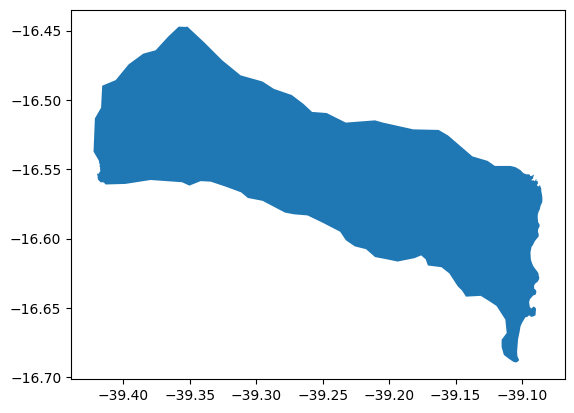

In [44]:
# Nome do local para consulta
bairro = "Trancoso, Porto Seguro, Bahia, Brasil"

# Obtenção do polígono do bairro
area = ox.geocode_to_gdf(bairro)

# Plotagem da área consultada
area.plot()

In [45]:
# Consulta e obtenção do polígono do local
area = ox.geocode_to_gdf(bairro)

# Obter o centro do polígono para centralizar o mapa
centro = [area.geometry.centroid.y.values[0], area.geometry.centroid.x.values[0]]

# Criar o mapa usando o centro do bairro
mapa = folium.Map(location=centro, zoom_start=10)

# Adicionar o polígono da área ao mapa
geo_json = area.to_json()
folium.GeoJson(geo_json, name="Trancoso").add_to(mapa)

# Utilização da biblioteca Folium para plotar o polígono do bairro
mapa

<ipython-input-45-6515154fe947>:5: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  centro = [area.geometry.centroid.y.values[0], area.geometry.centroid.x.values[0]]


# 3. Análise e Plotagem de Edificações

In [46]:
# Definindo a tag para buscar contornos de edifícios
tags = {"building": True}

# Extração dos dados das edificações no bairro
gdf_edificios = ox.features_from_place(bairro, tags)

# Realizaçãp de contagem de quantas edificações fazem parte do conjunto de dados
print("Número de edificações:", gdf_edificios.shape[0])

Número de edificações: 517


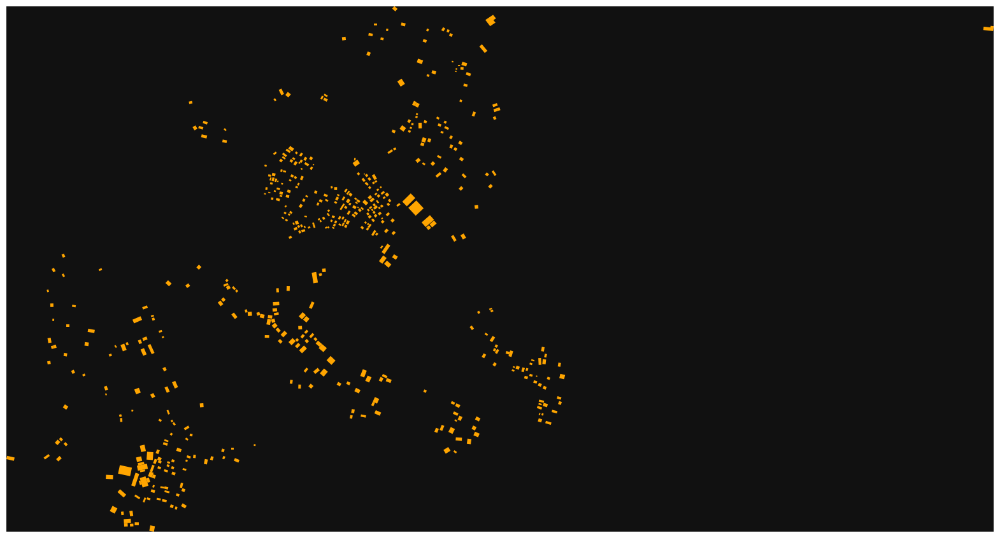

In [47]:
# Plotando os contornos dos edifícios
fig, ax = ox.plot_footprints(gdf_edificios, figsize=(20, 15))

In [80]:
# Criando o mapa centrado no bairro Trancoso
mapa = folium.Map(location=centro, zoom_start=11)

# Adicionando o polígono da área ao mapa
geo_json = area.to_json()
folium.GeoJson(geo_json, name="Bairro Trancoso").add_to(mapa)

# Adicionando os contornos dos edifícios ao mapa
for _, row in gdf_edificios.iterrows():
    # Verifica se a geometria é um polígono antes de adicionar ao mapa
    if row.geometry.geom_type == 'Polygon':
        folium.GeoJson(row.geometry.__geo_interface__, style_function=lambda x: {
            'fillColor': 'grey', 'color': 'black', 'weight': 0.5, 'fillOpacity': 0.7
        }).add_to(mapa)

# Plotagem das edificações no mapa com o Folium
mapa

# 4. Análise e Plotagem de Parques

In [49]:
# Definindo a tag para buscar parques
tags = {"leisure": "park"}

# Obtenção dos dados dos parques no bairro
gdf_parques = ox.features_from_place(bairro, tags)

# Realização de contagem de quantos parques estão presentes na área de estudo
print("Número de parques:", gdf_parques.shape[0])

Número de parques: 3


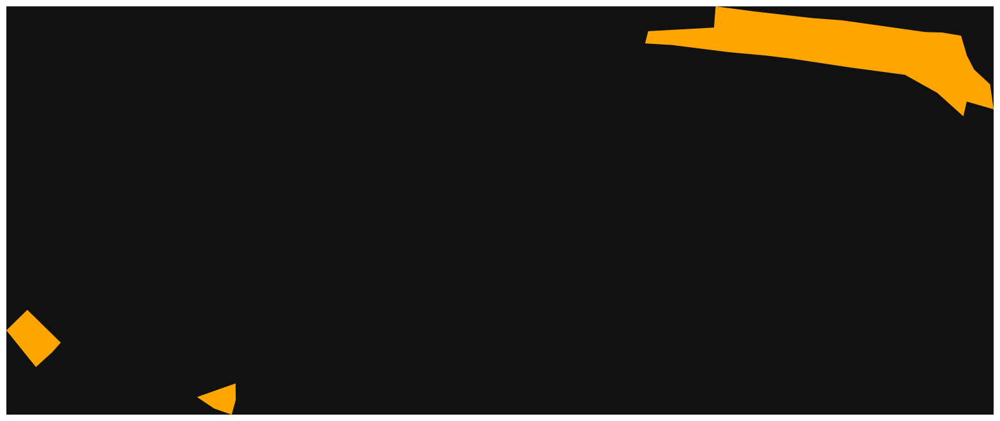

In [50]:
# Plotando os contornos dos parques
fig, ax = ox.plot_footprints(gdf_parques, figsize=(20, 15))

In [81]:
# Adicionando os contornos dos parques ao mapa interativo
for _, row in gdf_parques.iterrows():
    if row.geometry.geom_type == 'Polygon':
        folium.GeoJson(row.geometry.__geo_interface__, style_function=lambda x: {
            'fillColor': 'green', 'color': 'darkgreen', 'weight': 0.5, 'fillOpacity': 0.6
        }).add_to(mapa)

# Plotagem dos parques no mapa
mapa

# 5. Análise e Plotagem de Amenidades

In [52]:
# Definir a tag para baixar todas as amenities
tags = {"amenity": True}

# Extração dos dados das amenidades no bairro
gdf_amenities = ox.features_from_place(bairro, tags)

# Contagem do número total de amenidades na área
print("Número de amenidades:", gdf_amenities.shape[0])

Número de amenidades: 59


<Axes: >

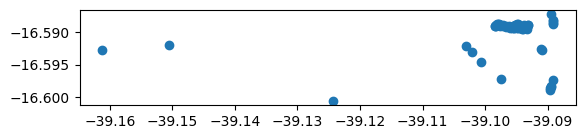

In [53]:
# Plotar as amenities em uma visualização estática
gdf_amenities.plot()

In [82]:
# Adicionando os pontos das amenities ao mapa interativo
for _, row in gdf_amenities.iterrows():
    if row.geometry.geom_type == 'Point':
        folium.GeoJson(
            row.geometry.__geo_interface__,
            tooltip=folium.Tooltip(row['amenity']),
            style_function=lambda x: {
                'fillColor': 'pink',
                'color': 'pink',
                'weight': 0.5,
                'fillOpacity': 0.6
            }
        ).add_to(mapa)

# Plotagem das amenidades no mapa
mapa

# 6. Análise e Plotagem de Hospitais

In [55]:
# Obtenção dos dados de hospitais no bairro
print(gdf_amenities['amenity'].unique())

['restaurant' 'bar' 'pharmacy' 'parking' 'school' 'fuel' 'cafe'
 'fast_food' 'atm' 'fountain' 'bank' 'boat_rental'
 'bicycle_repair_station' 'theatre' 'place_of_worship']


Observação: na falta de hospitais no bairro escolhido, optamos por analisarmos e plotarmos os dados de farmácias

In [65]:
# Definir a tag para baixar apenas farmácias
tags = {"amenity": "pharmacy"}

# Obtenção dos dados de farmácias no bairro
gdf_farmacias = ox.features_from_place(bairro, tags)

# Contagem do número de farmácias na área
print("Número de farmácias:", gdf_farmacias.shape[0])

Número de farmácias: 2


<Axes: >

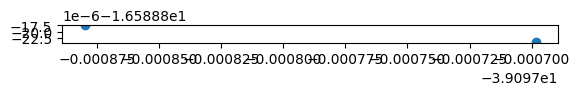

In [62]:
# Plotar as farmácias
gdf_farmacias.plot()

In [85]:
# Adicionando os pontos das farmácias ao mapa interativo
for _, row in gdf_farmacias.iterrows():
    if row.geometry.geom_type == 'Point':
        folium.Marker(
            location=[row.geometry.y, row.geometry.x],
            popup=row['amenity'],
            icon=folium.Icon(color='red')
        ).add_to(mapa)

# Plotagem das farmácias no mapa
mapa

# 7. Análise e Plotagem de Paradas de Ônibus

In [76]:
# Definir a tag para baixar pontos de ônibus
tags = {"highway": "bus_stop"}

# Extração dos dados das paradas de ônibus no bairro
gdf_onibus = ox.features_from_place(bairro, tags)

# Contagem do número de paradas de ônibus
print("Número de paradas de ônibus:", gdf_onibus.shape[0])

Número de paradas de ônibus: 2


<Axes: >

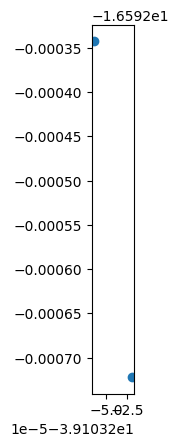

In [77]:
# Plotar os pontos de ônibus
gdf_onibus.plot()

In [89]:
# Adicionando os paradas de ônibus ao mapa interativo
for _, row in gdf_onibus.iterrows():
    if row.geometry.geom_type == 'Point':
        folium.Marker(
            location=[row.geometry.y, row.geometry.x],
            icon=folium.Icon(color='purple')
        ).add_to(mapa)

# Plotagem das paradas de ônibus no mapa
mapa

# 8. Mapa Combinado

<ipython-input-92-676f31059083>:22: UserWarning: Legend does not support handles for PatchCollection instances.
See: https://matplotlib.org/stable/tutorials/intermediate/legend_guide.html#implementing-a-custom-legend-handler
  ax.legend(handles=[edificios_patch, parques_patch] + ax.get_legend_handles_labels()[0])


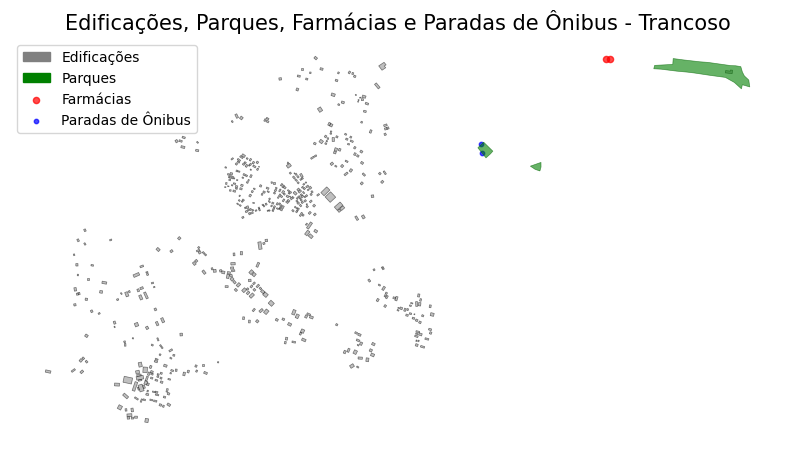

In [92]:
import matplotlib.patches as mpatches

# Criar a figura e o eixo para o plot
fig, ax = plt.subplots(figsize=(10, 10))

# Plotar os contornos das edificações
gdf_edificios.plot(ax=ax, color="grey", edgecolor="black", alpha=0.5, linewidth=0.5, label="Edificações")
edificios_patch = mpatches.Patch(color='grey', label='Edificações')

# Plotar os farmácias
gdf_farmacias.plot(ax=ax, color="red", markersize=20, label="Farmácias", alpha=0.7)

# Plotar as paradas de ônibus
gdf_onibus.plot(ax=ax, color="blue", markersize=10, label="Paradas de Ônibus", alpha=0.7)

# Plotar os parques
gdf_parques.plot(ax=ax, color="green", edgecolor="darkgreen", alpha=0.6, linewidth=0.5, label="Parques")
parques_patch = mpatches.Patch(color='green', label='Parques')

# Adicionar título e legenda
ax.set_title("Edificações, Parques, Farmácias e Paradas de Ônibus - Trancoso", fontsize=15)
ax.legend(handles=[edificios_patch, parques_patch] + ax.get_legend_handles_labels()[0])

# Remover eixos para uma visualização mais limpa
ax.set_axis_off()

# Criação de um mapa combinando as localizações das edificações, parques, hospitais e paradas de ônibus
# Observação: na ausência de hospitais, optamos pelo emprego dos dados relacionados às farmácias
plt.show()

# 9. Obtenção e Visualização da Rede Viária

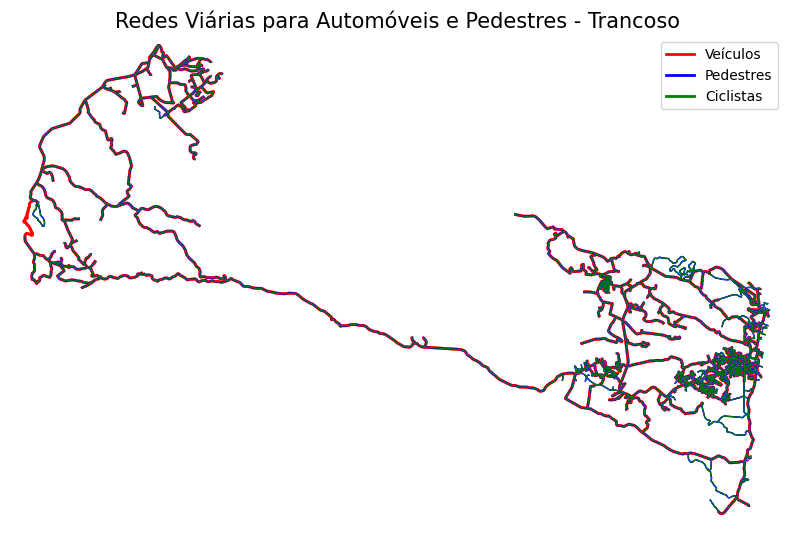

In [93]:
# Obteção dos grafos da rede viária do bairro para veículos, pedestres e ciclistas
grafo_automoveis = ox.graph_from_place(bairro, network_type="drive")
grafo_pedestres = ox.graph_from_place(bairro, network_type="walk")
grafo_ciclistas = ox.graph_from_place(bairro, network_type="bike")

# Criar a figura e o eixo para o plot
fig, ax = plt.subplots(figsize=(10, 10))

# Plotar a rede viária para automóveis em vermelho
ox.plot_graph(grafo_automoveis, ax=ax, node_size=0, edge_color="red", edge_linewidth=2, show=False, close=False)

# Plotar a rede viária para pedestres em azul
ox.plot_graph(grafo_pedestres, ax=ax, node_size=0, edge_color="blue", edge_linewidth=1, show=False, close=False)

# Plotar a rede viária para ciclistas em verde
ox.plot_graph(grafo_pedestres, ax=ax, node_size=0, edge_color="green", edge_linewidth=0.5, show=False, close=False)

# Adicionar título e legenda
ax.set_title("Redes Viárias para Automóveis e Pedestres - Trancoso", fontsize=15)
legend_elements = [plt.Line2D([0], [0], color="red", lw=2, label="Veículos"),
                   plt.Line2D([0], [0], color="blue", lw=2, label="Pedestres"),
                   plt.Line2D([0], [0], color="green", lw=2, label="Ciclistas")]
ax.legend(handles=legend_elements, loc="upper right")

# Plotagem da rede viária de cada modo de transporte
plt.show()

# 10. Visualização com Múltiplos Mapas de Fundo

In [94]:
# Converter as arestas para GeoDataFrame e explorar interativamente
grafo_rede_viaria = ox.graph_from_place(bairro, network_type="drive")
ox.graph_to_gdfs(grafo_rede_viaria, nodes=False).explore()

# Criação de visualização da rede viária (nós), variando o mapa de fundo (tiles)
nodes = ox.graph_to_gdfs(grafo_rede_viaria, edges=False)
nodes.explore(tiles="cartodbpositron", marker_kwds={"radius": 2})

In [95]:
# Converter o grafo em GeoDataFrames para nós e arestas
nodes, edges = ox.graph_to_gdfs(grafo_rede_viaria)

# Criação de visualização da rede viária (arestas e nós), variando o mapa de fundo (tiles)
m = edges.explore(color="skyblue", tiles="cartodbdarkmatter")
nodes.explore(m=m, color="pink", marker_kwds={"radius": 2})

# 11. Consultas e Visualizações de Nós da Rede Viária

In [96]:
# Converter para GeoDataFrames
gdf_nos, gdf_arestas = ox.graph_to_gdfs(grafo_rede_viaria)

# Contagem do número de nós
print("Número total de nós:", len(gdf_nos))

Número total de nós: 923


In [97]:
# Listar os atributos dos nós
print(gdf_nos.columns)

Index(['y', 'x', 'street_count', 'highway', 'geometry'], dtype='object')


In [ ]:
# Identificar os valores únicos de algum atributo dos nós
street_count_unicos = gdf_nos['street_count'].dropna().unique()
print("Valores únicos de street_count:", street_count_unicos)

Valores únicos de street_count: [3 4 1 2]


In [ ]:
# Filtrar apenas os nós com as classes de street_count desejadas
classes_street_count = [1, 2, 3, 4]
gdf_street_count_nos = gdf_nos[gdf_nos['street_count'].isin(classes_street_count)]

# Geração de visualização classificada por atributo (street_count) dos nós
gdf_street_count_nos.explore(
    column="street_count",
    legend=True,
    tiles="CartoDB Positron",
    tooltip="street_count",
    cmap="Paired",
    marker_kwds={
        "radius": 3,
        "fill": True,
    },
    style_kwds={
        "stroke": True,
        "color": "black",
        "weight": 0.5
    }
)

# 12. Consultas e Visualizações de Arestas da Rede Viária

In [ ]:
# Contagem do número de arestas
len(gdf_arestas)

2277

In [ ]:
# Cálculo do comprimento total da rede viária (em metros)
comprimento_total = gdf_arestas["length"].sum()
print("Comprimento total da rede viária (metros):", round(comprimento_total, 2))

Comprimento total da rede viária (metros): 663552.27


In [ ]:
# Lista dos atributos das arestas
print(gdf_arestas.columns)

Index(['osmid', 'oneway', 'lanes', 'ref', 'highway', 'reversed', 'length',
       'geometry', 'name', 'bridge', 'junction'],
      dtype='object')


In [ ]:
# Identificação de valores únicos de algum atributo das arestas
# Lista atributos que queremos consultar
atributos = ['lanes', 'highway', 'oneway', 'reversed', 'bridge', 'junction', 'oneway',]

print("\nValores únicos dos atributos:")
for coluna in atributos:
    # Converter listas em tuplas para usar com set() e coletar valores únicos
    valores_unicos = set(tuple(valor) if isinstance(valor, list) else valor for valor in gdf_arestas[coluna].dropna())
    print(f"{coluna}: {valores_unicos}")


Valores únicos dos atributos:
lanes: {'2'}
highway: {'unclassified', 'secondary', 'living_street', ('residential', 'unclassified'), 'tertiary', 'residential', 'secondary_link'}
oneway: {False, True}
reversed: {False, True, (False, True)}
bridge: {'yes'}
junction: {'circular'}
oneway: {False, True}


In [ ]:
# Visualização 1: Classificação pelo atributo "bridge" das arestas

# Extrair arestas que são pontes diretamente do grafo
pontes_arestas = [
    (u, v, k) for u, v, k, data in grafo_rede_viaria.edges(keys=True, data=True)
    if data.get("bridge") in ["yes"]
]

# Criar um subgrafo contendo apenas essas arestas
grafo_pontes = grafo_rede_viaria.edge_subgraph(pontes_arestas)

# Converter o subgrafo em um GeoDataFrame
gdf_pontes = ox.utils_graph.graph_to_gdfs(grafo_pontes, nodes=False)

# Plotar usando .explore()
gdf_pontes.explore(
    column="bridge",
    legend=True,
    tiles="CartoDB Positron",
    tooltip=["name", "bridge"],
    style_kwds={
        "color": "red",
        "weight": 2
    }
)

<ipython-input-100-ba7288ed0c15>:11: FutureWarning: The `graph_to_gdfs` function has moved to the `convert` module. Calling `utils_graph.graph_to_gdfs` is deprecated and will be removed in the v2.0.0 release. Call it via `convert.graph_to_gdfs` instead. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  gdf_pontes = ox.utils_graph.graph_to_gdfs(grafo_pontes, nodes=False)


In [ ]:
# Visualização 2: Classificação pelo atributo "highway" das arestas

# Converter valores da coluna "highway" para string, caso contenham listas
edges["highway"] = edges["highway"].apply(lambda x: ', '.join(x) if isinstance(x, list) else x)

# Explorar as arestas do grafo interativamente, coloridas por tipo de via
edges.explore(tiles="cartodbdarkmatter", column="highway", cmap="tab20b")